In [1]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline

In [2]:
from rdkit import Chem
from rdkit.Chem import AllChem
import matplotlib.pyplot as plt
from matplotlib import rc
rc('font', **{'family':'serif','serif':['Times']})
rc('text', usetex=True)
import pandas as pd
import sys
import os
import tqdm
import numpy as np
from itertools import product
from _utils import assign_hydrogen_pdbinfo, map_mol_with_noe

In [5]:
mol = Chem.MolFromPDBFile("/home/shuwang/Documents/Modelling/CP/Codes/NOE/CsA/CsA_chcl3_noebounds_numconf5400.pdb", removeHs = False)

df = pd.read_csv("/home/shuwang/Documents/Modelling/CP/Codes/NOE/CsA/CsA_chcl3_noebounds.csv", sep = "\s", comment = "#")

mol_atom_names2atom_index, noe_atom_names2mol_atom_names, noe_atom_pair2upper_distance = map_mol_with_noe(mol, df, verbose = False)

index_1, index_2 = [], [] #symmetric, thus two lists are interchangable
labels = []
ref_val = []
for key, val in noe_atom_pair2upper_distance.items():
    tmp_1 = noe_atom_names2mol_atom_names[key[0]]
    tmp_2 = noe_atom_names2mol_atom_names[key[1]]
    a = mol_atom_names2atom_index[tmp_1]
    b = mol_atom_names2atom_index[tmp_2]
    for item in product(a,b):
        index_1.append(item[0])
        index_2.append(item[1])
        ref_val.append(val)
        labels.append("{}:{}{}-{}:{}{} ({:0.1f})".format(item[0], tmp_1[0], tmp_1[1], item[1], tmp_2[0], tmp_2[1], val))

distance_matrix_for_each_conformer = np.array([Chem.Get3DDistanceMatrix(mol, i) for i in tqdm.tqdm(range(mol.GetNumConformers()))])

with_noe = distance_matrix_for_each_conformer[:, index_1, index_2]

mol = Chem.MolFromPDBFile("/home/shuwang/Documents/Modelling/CP/Codes/NOE/CsA/baseline_numconf5400.pdb", removeHs = False)

distance_matrix_for_each_conformer = np.array([Chem.Get3DDistanceMatrix(mol, i) for i in tqdm.tqdm(range(mol.GetNumConformers()))])

baseline = distance_matrix_for_each_conformer[:, index_1, index_2]

100%|██████████| 5400/5400 [00:03<00:00, 1572.18it/s]


In [11]:
np.argsort(np.sum((plot_1 - ref_val) < 0, 1))[-20:]

array([1811, 1810, 1809, 1808, 1807, 1806, 1805, 1804, 1855, 1803, 1801,
       1800, 1799, 1798, 1797, 1796, 1795, 1794, 1802, 5399])

In [12]:
(np.sum((plot_1 - ref_val) < 0, 1))[-20:]

array([512, 512, 512, 512, 512, 512, 512, 512, 512, 512, 512, 512, 512,
       512, 512, 512, 512, 512, 512, 512])

In [16]:
tmp = plot_1 - ref_val
tmp[tmp < 0] = 0
np.argsort(np.sum(tmp, 1))[:20], np.sum(tmp,1)[-50:]

(array([   0, 3604, 3603, 3602, 3601, 3600, 3599, 3598, 3597, 3596, 3595,
        3594, 3593, 3592, 3591, 3590, 3589, 3588, 3605, 3587]),
 array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]))

5400
0


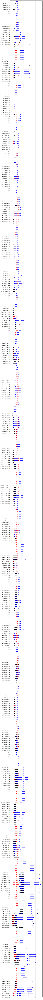

CPU times: user 42.7 s, sys: 1.1 s, total: 43.8 s
Wall time: 46.9 s


In [8]:
plot_1, plot_2 = with_noe, baseline

print(sum(np.all((plot_1 - ref_val) < 0, 1)))
print(sum(np.all((plot_2 - ref_val) < 0, 1)))


widths = 0.4
offsets = 0.2
fig1, ax1 = plt.subplots(1, 1, figsize = (8,250))
def set_box_color(bp, color):
    plt.setp(bp['boxes'], color=color)
    plt.setp(bp['whiskers'], color=color)
    plt.setp(bp['caps'], color=color)
    plt.setp(bp['medians'], color=color)
# ax1.set_title('Basic Plot')
red_square = dict(markerfacecolor='r', marker='o')
blue_square = dict(markerfacecolor='b', marker='o')

bp_1 = ax1.boxplot([plot_1[:,i] for i in range(plot_1.shape[1])], vert = False, widths = widths, flierprops = red_square)
bp_2 = ax1.boxplot([plot_2[:,i] for i in range(plot_2.shape[1])], vert = False, widths = widths, flierprops = blue_square)

set_box_color(bp_1, "red")
set_box_color(bp_2, "blue")
## with the offset it takes much longer to plot
# ax1.boxplot([plot_1[:,i] for i in range(plot_1.shape[1])], positions = np.array(range(plot_1.shape[1])) + offset, vert = False, flierprops = red_square, widths = width)
# ax1.boxplot([plot_2[:,i] for i in range(plot_2.shape[1])], positions = np.array(range(plot_2.shape[1])) - offset, vert = False, flierprops = blue_square, widths = width)

ax1.set_xlabel('Distance (Å)')
plt.grid(axis = "x", which = "both")
# plt.grid(axis = "y", which = "major")
# plt.axvline(x=2.20589566)
plt.yticks(range(plot_1.shape[1]), labels)
%time plt.show()

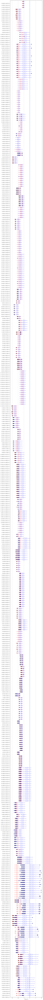

CPU times: user 39.4 s, sys: 954 ms, total: 40.3 s
Wall time: 43 s


In [10]:
plot_1, plot_2 = with_noe, baseline
plot_1 -= ref_val
plot_2 -= ref_val

widths = 0.4
offsets = 0.2
fig1, ax1 = plt.subplots(1, 1, figsize = (8,250))
def set_box_color(bp, color):
    plt.setp(bp['boxes'], color=color)
    plt.setp(bp['whiskers'], color=color)
    plt.setp(bp['caps'], color=color)
    plt.setp(bp['medians'], color=color)
# ax1.set_title('Basic Plot')
red_square = dict(markerfacecolor='r', marker='o')
blue_square = dict(markerfacecolor='b', marker='o')

bp_1 = ax1.boxplot([plot_1[:,i] for i in range(plot_1.shape[1])], vert = False, widths = widths, flierprops = red_square)
bp_2 = ax1.boxplot([plot_2[:,i] for i in range(plot_2.shape[1])], vert = False, widths = widths, flierprops = blue_square)

set_box_color(bp_1, "red")
set_box_color(bp_2, "blue")
## with the offset it takes much longer to plot
# ax1.boxplot([plot_1[:,i] for i in range(plot_1.shape[1])], positions = np.array(range(plot_1.shape[1])) + offset, vert = False, flierprops = red_square, widths = width)
# ax1.boxplot([plot_2[:,i] for i in range(plot_2.shape[1])], positions = np.array(range(plot_2.shape[1])) - offset, vert = False, flierprops = blue_square, widths = width)

ax1.set_xlabel('Distance (Å)')
plt.grid(axis = "x", which = "both")
# plt.grid(axis = "y", which = "major")
plt.axvline(x=0)
plt.yticks(range(plot_1.shape[1]), labels)
%time plt.show()

In [20]:
md.load("/home/shuwang/Documents/Modelling/CP/Codes/NOE/CsA/CsA_chcl3_noebounds_numconf5400.pdb")[0].save("./tmp.pdb")

In [17]:
import mdtraj as md
import cpeptools
import tempfile
def get_rmsd(smiles, pdb_path, ref_pdb_path):
    smiles_mol = Chem.MolFromSmiles(smiles)
    ref_mol = Chem.MolFromPDBFile(ref_pdb_path)
    mol = Chem.MolFromPDBFile(pdb_path)

    ref_mol = AllChem.AssignBondOrdersFromTemplate(smiles_mol,ref_mol)
    mol = AllChem.AssignBondOrdersFromTemplate(smiles_mol, mol)
    order = list(mol.GetSubstructMatches(ref_mol)[0])
    mol = Chem.RenumberAtoms(mol, order)

    indices = cpeptools.get_largest_ring(ref_mol)
    indices = cpeptools.mol_ops.get_neighbour_indices(ref_mol, indices)
    #assert len(set(indices) - set(cpeptools.get_largest_ring(mol))) == 0, "ring atom indices do not agree"

    tmp_dir = tempfile.mkdtemp()
    ref_pdb_filename = tempfile.mktemp(suffix=".pdb", dir = tmp_dir)
    pdb_filename = tempfile.mktemp(suffix=".pdb", dir = tmp_dir)
    Chem.MolToPDBFile(ref_mol, ref_pdb_filename)
    Chem.MolToPDBFile(mol, pdb_filename)

    ref  = md.load(ref_pdb_filename)
    #ref = ref.center_coordinates()
    compare = md.load(pdb_filename)
    #compare = compare.center_coordinates()
    #print(compare, mol.GetNumConformers())
    print(" {} has {} conformers".format(smiles, len(compare)))


    bb_rmsd = md.rmsd(compare, ref, 0, atom_indices = indices)
    compare = compare.superpose(ref, 0, atom_indices = indices)
    return bb_rmsd, compare[np.argmin(bb_rmsd)]

In [18]:
%time _, tmp = get_rmsd("CC[C@H]1C(=O)N(CC(=O)N([C@H](C(=O)N[C@H](C(=O)N([C@H](C(=O)N[C@H](C(=O)N[C@@H](C(=O)N([C@H](C(=O)N([C@H](C(=O)N([C@H](C(=O)N([C@H](C(=O)N1)[C@@H]([C@H](C)C/C=C/C)O)C)C(C)C)C)CC(C)C)C)CC(C)C)C)C)C)CC(C)C)C)C(C)C)CC(C)C)C)C", "/home/shuwang/Documents/Modelling/CP/Codes/NOE/CsA/CsA_chcl3_noebounds_numconf5400.pdb", "/home/shuwang/Documents/Modelling/CP/Codes/NOE/CsA/ref.pdb")

CC[C@H]1C(=O)N(CC(=O)N([C@H](C(=O)N[C@H](C(=O)N([C@H](C(=O)N[C@H](C(=O)N[C@@H](C(=O)N([C@H](C(=O)N([C@H](C(=O)N([C@H](C(=O)N([C@H](C(=O)N1)[C@@H]([C@H](C)C/C=C/C)O)C)C(C)C)C)CC(C)C)C)CC(C)C)C)C)C)CC(C)C)C)C(C)C)CC(C)C)C)C has 5400 conformers
CPU times: user 17.7 s, sys: 691 ms, total: 18.4 s
Wall time: 20.3 s


In [19]:
tmp.save("./rmsd_tmp.pdb")

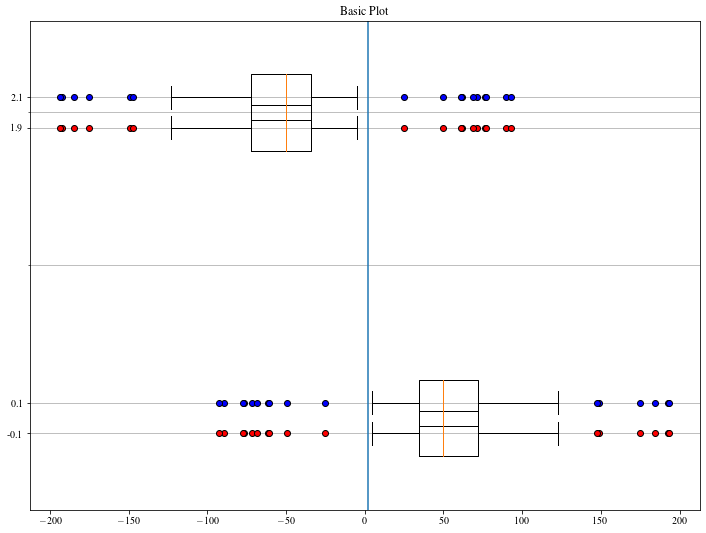

In [102]:
fig1, ax1 = plt.subplots(1, 1, figsize = (12,9))
ax1.set_title('Basic Plot')
red_square = dict(markerfacecolor='r', marker='o')
blue_square = dict(markerfacecolor='b', marker='o')
ax1.boxplot([data, -data], positions = np.array(range(2))*2.0-0.1, vert = False, flierprops = red_square)
ax1.boxplot([data, -data], positions = np.array(range(2))*2.0+0.1, vert = False, flierprops = blue_square)
ax1.set_yticks([1,2], ["x", "y"])
plt.grid(axis = "y", which = "both")
# plt.grid(axis = "x", which = "major")
plt.axvline(x=2.20589566)

plt.show()